In [27]:
import time

start_time = time.time()

from string import punctuation
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.stem.snowball import SnowballStemmer
import nltk
import re
import string
import numpy as np
import spacy
import pandas as pd
from fuzzywuzzy import fuzz
from nltk.corpus import stopwords
import heapq
import yaml
from nltk.stem import WordNetLemmatizer, PorterStemmer

from transformers import AutoTokenizer, AutoModelForSequenceClassification, AutoConfig
from scipy.special import softmax
import numpy as np
from array import array
import copy
import matplotlib.pyplot as plt

nlp = spacy.load('en_core_web_lg')

nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')

# df = pd.read_csv('./scraper/archive/react-useeffect-final-clean.csv', names=["POSTID", "POSTLINK", "POSTTITLE", "POSTBODY", "POSTDATE", "POSTVOTECOUNTS", "COMMENTID", "COMMENTSCORE", "COMMENTUSERNAME", "COMMENTTEXT", "COMMENTDATETIME", "ANSWERID", "ANSWERTEXT", "ANSWERBODY", "ANSWERDATETIME", "ANSWERVOTECOUNTS", "ANSWERCMTID", "ANSWERCMTTEXT", "ANSWERCMTBODY", "ANSWERCMTDATETIME", "ANSWERCMTVOTECOUNTS" , "TYPE"])
df = pd.read_csv('./scraper/archive/react-useeffect-final-clean.csv')


# query = 'Reverse binary tree'
# query = 'convert date to string'
# query = 'Useeffect hook rerenders infinitely'
# query = 'convert date to string'
query = 'Fetching data - useEffect hook'
# query 3 = 'How to use the useEffect hook?'
# query 4 = "useEffect hook doesn't work"
# query 5 = "Use effect hook with use state"

print(df.shape)

print("\n")
print("All Columns DF")
df.columns

[nltk_data] Downloading package stopwords to /Users/shaun/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /Users/shaun/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /Users/shaun/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


(3461, 22)


All Columns DF


Index(['POSTID', 'POSTLINK', 'POSTTITLE', 'POSTBODY', 'POSTDATE',
       'POSTVOTECOUNTS', 'TYPE', 'COMMENTID', 'COMMENTSCORE',
       'COMMENTUSERNAME', 'COMMENTTEXT', 'COMMENTDATETIME', 'ANSWERID',
       'ANSWERTEXT', 'ANSWERBODY', 'ANSWERDATETIME', 'ANSWERVOTECOUNTS',
       'ANSWERCMTID', 'ANSWERCMTTEXT', 'ANSWERCMTBODY', 'ANSWERCMTDATETIME',
       'ANSWERCMTVOTECOUNTS'],
      dtype='object')

In [28]:
ALL_COLS = ["POSTID", "POSTLINK", "POSTTITLE", "POSTBODY", "POSTDATE", "POSTVOTECOUNTS", "COMMENTID", "COMMENTSCORE", "COMMENTUSERNAME", "COMMENTTEXT", "COMMENTDATETIME", "ANSWERID", "ANSWERTEXT", "ANSWERBODY", "ANSWERDATETIME", "ANSWERVOTECOUNTS", "ANSWERCMTID", "ANSWERCMTTEXT", "ANSWERCMTBODY", "ANSWERCMTDATETIME", "ANSWERCMTVOTECOUNTS" , "TYPE"]

dPOST  = pd.DataFrame(columns=ALL_COLS)
dPOST = df.copy();
dPOST = dPOST.drop(columns=['COMMENTID', 'COMMENTSCORE', 'COMMENTUSERNAME', 'COMMENTTEXT', 'COMMENTDATETIME', 'ANSWERID', 'ANSWERTEXT', 'ANSWERBODY', 'ANSWERDATETIME', 'ANSWERVOTECOUNTS', 'ANSWERCMTID', 'ANSWERCMTTEXT', 'ANSWERCMTBODY', 'ANSWERCMTDATETIME', 'ANSWERCMTVOTECOUNTS'])
# drop if type is not post
dPOST = dPOST[dPOST['TYPE'] == 'post']

dfPC = pd.DataFrame(columns=ALL_COLS)
dfPC = df.copy();
dfPC = dfPC.drop(columns=['ANSWERID', 'ANSWERTEXT', 'ANSWERBODY', 'ANSWERDATETIME', 'ANSWERVOTECOUNTS', 'ANSWERCMTID', 'ANSWERCMTTEXT', 'ANSWERCMTBODY', 'ANSWERCMTDATETIME', 'ANSWERCMTVOTECOUNTS'])
# drop if type is not post
dfPC = dfPC[dfPC['TYPE'] == 'post_comment']

dfA = pd.DataFrame(columns=ALL_COLS)
dfA = df.copy();
dfA = dfA.drop(columns=['POSTLINK', 'POSTBODY', 'POSTDATE', 'POSTVOTECOUNTS', 'COMMENTID', 'COMMENTSCORE', 'COMMENTUSERNAME', 'COMMENTTEXT', 'COMMENTDATETIME', 'ANSWERCMTID', 'ANSWERCMTTEXT', 'ANSWERCMTBODY', 'ANSWERCMTDATETIME', 'ANSWERCMTVOTECOUNTS'])

dfAAC = dfA[dfA['TYPE'] == 'answer']

dFAC = pd.DataFrame(columns=ALL_COLS)
dFAC = df.copy();
dFAC = dFAC.drop(columns=['POSTLINK', 'POSTBODY', 'POSTDATE', 'POSTVOTECOUNTS', 'COMMENTID', 'COMMENTSCORE', 'COMMENTUSERNAME', 'COMMENTTEXT', 'COMMENTDATETIME', 'ANSWERTEXT', 'ANSWERBODY', 'ANSWERDATETIME', 'ANSWERVOTECOUNTS'])
dFACT = dFAC[dFAC['TYPE'] == 'answer_comment']
display(dFACT.head(3))

print("Post DF")
print(dPOST.columns)
print('\n')

print("Post Comment DF")
print(dfPC.columns)
print('\n')

print("Answer DF")
print(dfAAC.columns)
print('\n')

print("Answer Comment DF")
print(dFACT.columns)
print('\n')

,POSTID,POSTTITLE,TYPE,ANSWERID,ANSWERCMTID,ANSWERCMTTEXT,ANSWERCMTBODY,ANSWERCMTDATETIME,ANSWERCMTVOTECOUNTS
2424,75140656,How do I set a timer on React/UseEffect hook a...,answer_comment,75140750.0,132598956.0,Using setTimeout like this without the users s...,('\n \n <span cl...,2 days ago,0.0
2425,75140656,How do I set a timer on React/UseEffect hook a...,answer_comment,75140750.0,132599241.0,@jsejcksn I think the intended behaviour is to...,('\n \n <span cl...,2 days ago,0.0
2426,75130904,How to avoid a small delay in scrolling on rea...,answer_comment,75131129.0,132582008.0,it works! thank you! never used useLayoutEffec...,('\n \n <span cl...,Jan 16 at 7:38,0.0


Post DF
Index(['POSTID', 'POSTLINK', 'POSTTITLE', 'POSTBODY', 'POSTDATE',
       'POSTVOTECOUNTS', 'TYPE'],
      dtype='object')


Post Comment DF
Index(['POSTID', 'POSTLINK', 'POSTTITLE', 'POSTBODY', 'POSTDATE',
       'POSTVOTECOUNTS', 'TYPE', 'COMMENTID', 'COMMENTSCORE',
       'COMMENTUSERNAME', 'COMMENTTEXT', 'COMMENTDATETIME'],
      dtype='object')


Answer DF
Index(['POSTID', 'POSTTITLE', 'TYPE', 'ANSWERID', 'ANSWERTEXT', 'ANSWERBODY',
       'ANSWERDATETIME', 'ANSWERVOTECOUNTS'],
      dtype='object')


Answer Comment DF
Index(['POSTID', 'POSTTITLE', 'TYPE', 'ANSWERID', 'ANSWERCMTID',
       'ANSWERCMTTEXT', 'ANSWERCMTBODY', 'ANSWERCMTDATETIME',
       'ANSWERCMTVOTECOUNTS'],
      dtype='object')




# Beginning of Idea A

### 1. String similarity to find related post

In [29]:
unique_values = df['POSTTITLE'].unique()
print("There are a total of {} unique titles".format(len(unique_values)))

There are a total of 679 unique titles


#### 1.1 Fuzzy Wuzzy

In [30]:
def calPartialRatio (str1, str2):
    return fuzz.partial_ratio(str1, str2)

def calTokenSortRatio (str1, str2):
    return fuzz.token_sort_ratio(str1, str2)

fuzzywuzzy_df = pd.DataFrame(columns=['postId', 'title', 'partial_ratio', 'token_sort_ratio'])
for unique_value in unique_values:
    # find the postId of the unique value
    postId = df[df['POSTTITLE'] == unique_value]['POSTID'].tolist()[0]
    fuzzywuzzy_df = pd.concat([fuzzywuzzy_df, pd.DataFrame({'postId': postId , 'title': unique_value, 'partial_ratio': calPartialRatio(unique_value, query), 'token_sort_ratio': calTokenSortRatio(unique_value, query)}, index=[0])], )

matchesPR = fuzzywuzzy_df.sort_values(by=['partial_ratio'], ascending=False)
matchesPR = matchesPR[matchesPR['partial_ratio'] > 50]

matchesTS = fuzzywuzzy_df.sort_values(by=['token_sort_ratio'], ascending=False)
matchesTS = matchesTS[matchesTS['token_sort_ratio'] > 50]

Top10MathesMerged = pd.concat([matchesTS, matchesPR]).drop_duplicates()
Top10MathesMerged['average'] = (Top10MathesMerged['token_sort_ratio'] + Top10MathesMerged['partial_ratio']) / 2
Top10MathesMerged = Top10MathesMerged.sort_values(by=['average'], ascending=False)


Top10MathesMerged = Top10MathesMerged[Top10MathesMerged['average'] > 60]
display(Top10MathesMerged)
print("{} number of titles found".format(len(Top10MathesMerged)))

,postId,title,partial_ratio,token_sort_ratio,average
0,66602996,React - useEffect,82,56,69.0
0,60984978,React useeffect hook,80,58,69.0
0,70633360,"I am facing a problem of fetching data (React,...",73,63,68.0
0,63003999,React useEffect,80,56,68.0
0,56914826,Using react useEffect hook,81,52,66.5
0,63800700,react useEffect hook cleanup,71,61,66.0
0,68836817,Confusing React useEffect hook behaviour,70,59,64.5
0,65373481,No response from Fetch API in React useEffect ...,73,56,64.5
0,67597259,Fetching json api using react ( useeffect ),61,66,63.5
0,53239470,react useEffect is running and fetching data n...,64,63,63.5


19 number of titles found


## 2. Group all comments into post

In [31]:
class GroupedComments: 
    def __init__(self, title, post, post_comments, answers, answer_comments): 
        self.title = title
        self.post = post
        self.post_comments = post_comments
        self.answers = answers
        self.answer_comments = answer_comments
        
def grouping(titleArr): 
    grouped = []
    for title in titleArr:
        try:
            post = dPOST[dPOST['POSTTITLE'].str.contains(title)]
            post_comments = dfPC[dfPC['POSTTITLE'].str.contains(title)]
            answers = dfAAC[dfAAC['POSTTITLE'].str.contains(title)]
            answer_comments = dFACT[dFACT['POSTTITLE'].str.contains(title)]
            grouped.append(GroupedComments(title, post, post_comments, answers, answer_comments))
        except Exception as e:
            pass
        
    return grouped 

allcommentsGrouped = grouping(Top10MathesMerged['title'].tolist())

print(len(allcommentsGrouped))

display(allcommentsGrouped[2].post_comments)
display(allcommentsGrouped[2].answers)
display(allcommentsGrouped[2].answer_comments)

19


/var/folders/x0/f6tjyw_s7vqbx5gcpvt0z31w0000gn/T/ipykernel_1627/984341418.py:13: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  post = dPOST[dPOST['POSTTITLE'].str.contains(title)]
/var/folders/x0/f6tjyw_s7vqbx5gcpvt0z31w0000gn/T/ipykernel_1627/984341418.py:14: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  post_comments = dfPC[dfPC['POSTTITLE'].str.contains(title)]
/var/folders/x0/f6tjyw_s7vqbx5gcpvt0z31w0000gn/T/ipykernel_1627/984341418.py:15: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  answers = dfAAC[dfAAC['POSTTITLE'].str.contains(title)]
/var/folders/x0/f6tjyw_s7vqbx5gcpvt0z31w0000gn/T/ipykernel_1627/984341418.py:16: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  answer_comments = dFACT[dFACT['POSTTITLE'].str.contains(title)]


,POSTID,POSTLINK,POSTTITLE,POSTBODY,POSTDATE,POSTVOTECOUNTS,TYPE,COMMENTID,COMMENTSCORE,COMMENTUSERNAME,COMMENTTEXT,COMMENTDATETIME


,POSTID,POSTTITLE,TYPE,ANSWERID,ANSWERTEXT,ANSWERBODY,ANSWERDATETIME,ANSWERVOTECOUNTS


,POSTID,POSTTITLE,TYPE,ANSWERID,ANSWERCMTID,ANSWERCMTTEXT,ANSWERCMTBODY,ANSWERCMTDATETIME,ANSWERCMTVOTECOUNTS


In [32]:
allCommentsGroupedCleanedDict = {}
for idx, item in enumerate(allcommentsGrouped):
    comments = []
    answers = []
    answers_cmts = []
    
    if (item.post_comments['COMMENTTEXT'].shape[0] > 0):
      for (index, comment) in item.post_comments['COMMENTTEXT'].items():
        comment_idx = item.post_comments[item.post_comments['COMMENTTEXT'] == comment]['COMMENTID'].tolist()[0]
        comment_votes = item.post_comments[item.post_comments['COMMENTTEXT'] == comment]['COMMENTSCORE'].tolist()[0]
        comment_dt = item.post_comments[item.post_comments['COMMENTTEXT'] == comment]['COMMENTDATETIME'].tolist()[0]
        if str(comment) != 'nan':
          comments.append({
            "comment": comment, 
            "id": comment_idx,
            "votes": comment_votes,
            "datetime": comment_dt
          })
    comments_joined = ' '.join([str(elem['comment']) for elem in comments])

    if (item.answers['ANSWERBODY'].shape[0] > 0):
      for (index, answer) in item.answers['ANSWERBODY'].items():
        answer_idx = item.answers[item.answers['ANSWERBODY'] == answer]['ANSWERID'].tolist()[0]
        answer_votes = item.answers[item.answers['ANSWERBODY'] == answer]['ANSWERVOTECOUNTS'].tolist()[0]
        answer_dt = item.answers[item.answers['ANSWERBODY'] == answer]['ANSWERDATETIME'].tolist()[0]
        if str(answer) != 'nan':
          answers.append({
            "answer": answer,
            "id": answer_idx,
            "votes": answer_votes,
            "datetime": answer_dt
          })
        
    answers_joined = ' '.join([str(elem['answer']) for elem in answers])
    
    for (index, answer_cmt) in item.answer_comments['ANSWERCMTBODY'].items():
      answer_cmt_idx = item.answer_comments[item.answer_comments['ANSWERCMTBODY'] == answer_cmt]['ANSWERCMTID'].tolist()[0]
      answer_cmt_votes = item.answer_comments[item.answer_comments['ANSWERCMTBODY'] == answer_cmt]['ANSWERCMTVOTECOUNTS'].tolist()[0]
      answer_cmt_dt = item.answer_comments[item.answer_comments['ANSWERCMTBODY'] == answer_cmt]['ANSWERCMTDATETIME'].tolist()[0]
      if str(answer_cmt) != 'nan':
        answers_cmts.append({
          "answer_cmt": answer_cmt,
          "id": 1,
          "votes": answer_cmt_votes,
          "datetime": answer_cmt_dt
        })
        
    answers_cmts_joined = ' '.join([str(elem['answer_cmt']) for elem in answers_cmts])
    
    allCommentsGroupedCleanedDict[item.title] = {
      "comments": comments,
      "answers": answers,
      "answer_comments": answers_cmts,
      "comments_joined": comments_joined,
      "answers_joined": answers_joined,
      "answers_cmts_joined": answers_cmts_joined
    }

print("{} number of post instances".format(len(allCommentsGroupedCleanedDict)))

print(yaml.dump(allCommentsGroupedCleanedDict, allow_unicode=True, default_flow_style=False))

19 number of post instances
Building a counter using React useEffect hook [duplicate]:
  answer_comments: []
  answers: []
  answers_cmts_joined: ''
  answers_joined: ''
  comments: []
  comments_joined: ''
Cancel a dynamic import in React useEffect hook:
  answer_comments: []
  answers: []
  answers_cmts_joined: ''
  answers_joined: ''
  comments:
  - comment: checkout <a href="https://stackoverflow.com/questions/72096891/useeffect-cleanup-in-react-18">this</a>
      question, it's kinda similar
    datetime: '2022-07-21 12:38:43Z'
    id: comment-129047134
    votes: 0.0
  comments_joined: checkout <a href="https://stackoverflow.com/questions/72096891/useeffect-cleanup-in-react-18">this</a>
    question, it's kinda similar
Confusing React useEffect hook behaviour:
  answer_comments:
  - answer_cmt: '(''\n                \n                <span class="comment-copy">well
      explained. I get the concept of closure over surrounding scope at render time.
      It completely makes sense

In [33]:
print(allCommentsGroupedCleanedDict)

{'React - useEffect': {'comments': [{'comment': 'I am very sorry for the late response. Thank you very much for your comment. Not calling the child component as a function solved the issue.', 'id': 'comment-132582176', 'votes': 1.0, 'datetime': '2023-01-16 07:51:53Z'}, {'comment': 'That was general recommendation though, a bit weird it helped with <code>useEffect</code>; if you can share reproducible example, I could try to look what was the issue', 'id': 'comment-132638828', 'votes': 0.0, 'datetime': '2023-01-18 19:23:58Z'}, {'comment': "Isn't that what the code already does?  I would expect <code>if(currentLeadId) {</code> to only execute when <code>currentLeadId</code> is not <code>null</code>.", 'id': 'comment-129795849', 'votes': 1.0, 'datetime': '2022-08-26 11:33:01Z'}, {'comment': 'You are mutating your state instead of reassigning it with the <code>setState</code> callback you created via <code>useState</code>. Consider splitting your state into independant values instead of on

## 3. Preprocessing

In [34]:
test_text = ('\n<p>You have to convert the response to json <a href="https://google.com">Please Look at this link</a> with await <a href="https://google.com">await</a> response.json();\nand then use setState.</p>\n\n<pre class="lang-js s-code-block"><code class="hljs language-javascript"><span class="hljs-title function_">useEffect</span>(<span class="hljs-function">() =&gt;</span> {         \n        <span class="hljs-variable language_">console</span>.<span class="hljs-title function_">log</span>(<span class="hljs-string">"useEffect TopTen has been called!"</span>);   \n        <span class="hljs-keyword">const</span> <span class="hljs-title function_">fetchdata</span> = <span class="hljs-keyword">async</span> (<span class="hljs-params"></span>) =&gt; {\n        <span class="hljs-keyword">const</span> response = <span class="hljs-keyword">await</span> api.<span class="hljs-title function_">topTen</span>();  <span class="hljs-comment">// this calls axios(url)</span>\n        <span class="hljs-keyword">const</span> responseData = <span class="hljs-keyword">await</span> response.<span class="hljs-title function_">json</span>();\n        <span class="hljs-title function_">setLoading</span>(<span class="hljs-literal">false</span>);\n        <span class="hljs-title function_">setTopten</span>(responseData.<span class="hljs-property">data</span>);    \n        <span class="hljs-title function_">setError</span>(responseData.<span class="hljs-property">error</span>);    \n    };\n\n    fetchdata ();     \n}, []);\n</code></pre>\n    ',)
print(str(test_text))

('\n<p>You have to convert the response to json <a href="https://google.com">Please Look at this link</a> with await <a href="https://google.com">await</a> response.json();\nand then use setState.</p>\n\n<pre class="lang-js s-code-block"><code class="hljs language-javascript"><span class="hljs-title function_">useEffect</span>(<span class="hljs-function">() =&gt;</span> {         \n        <span class="hljs-variable language_">console</span>.<span class="hljs-title function_">log</span>(<span class="hljs-string">"useEffect TopTen has been called!"</span>);   \n        <span class="hljs-keyword">const</span> <span class="hljs-title function_">fetchdata</span> = <span class="hljs-keyword">async</span> (<span class="hljs-params"></span>) =&gt; {\n        <span class="hljs-keyword">const</span> response = <span class="hljs-keyword">await</span> api.<span class="hljs-title function_">topTen</span>();  <span class="hljs-comment">// this calls axios(url)</span>\n        <span class="hljs-keyw

In [35]:
from nltk.corpus import stopwords


stopwords = set(stopwords.words('english'))

#### 3.1 Finding tech related stop words

In [36]:
# adding stopwords to the list
engineering_stop_words=['able','above-mentioned','accordingly','across','along','already','alternatively','always','among','and/or','anything','anywhere','better','disclosure','due','easily','easy','eg','either','elsewhere','enough','especially','essentially','et','al','etc','eventually','excellent','finally','furthermore','good','hence','he/she','him/her','his/her','ie','ii','iii','instead','later','like','little','many','may','meanwhile','might','moreover','much','must','never','often','others','otherwise','overall','rather','remarkably','significantly','simply','sometimes','specifically','straight','forward','substantially','thereafter','therebetween','therefor','therefrom','therein','thereinto+','thereon','therethrough','therewith','together','toward','towards','typical','typically','upon','via','vice','versa','whatever','whereas','whereat','wherever','whether','whose','within','without','yet']
stopwords.update(engineering_stop_words)

print(engineering_stop_words)
print(stopwords)

['able', 'above-mentioned', 'accordingly', 'across', 'along', 'already', 'alternatively', 'always', 'among', 'and/or', 'anything', 'anywhere', 'better', 'disclosure', 'due', 'easily', 'easy', 'eg', 'either', 'elsewhere', 'enough', 'especially', 'essentially', 'et', 'al', 'etc', 'eventually', 'excellent', 'finally', 'furthermore', 'good', 'hence', 'he/she', 'him/her', 'his/her', 'ie', 'ii', 'iii', 'instead', 'later', 'like', 'little', 'many', 'may', 'meanwhile', 'might', 'moreover', 'much', 'must', 'never', 'often', 'others', 'otherwise', 'overall', 'rather', 'remarkably', 'significantly', 'simply', 'sometimes', 'specifically', 'straight', 'forward', 'substantially', 'thereafter', 'therebetween', 'therefor', 'therefrom', 'therein', 'thereinto+', 'thereon', 'therethrough', 'therewith', 'together', 'toward', 'towards', 'typical', 'typically', 'upon', 'via', 'vice', 'versa', 'whatever', 'whereas', 'whereat', 'wherever', 'whether', 'whose', 'within', 'without', 'yet']
{'both', 'typically', 

In [37]:
# translate_table = dict((ord(char), None) for char in punctuation if char not in [' ', '\t', ' ', '\r', ",", ';', '?', '!'])
# translate_table.update(dict((ord(char), None) for char in string.digits))

# # find tech related stop words
# tech_stopwords = set(stopwords.words('english'))

# remove stopwords from the text
temp_text = "Imagine if that was a Web Socket and we were scheduling a new heartbeat tick every time we remounted; the server would be very angry at our apps heart palpitations."
def remove_stopwords(text):
    text = text.lower()
    text = text.split()
    text = [word for word in text if not word in stopwords]
    text = " ".join(text)
    return text
  
# remove stopwords from the text
print(remove_stopwords(temp_text))

imagine web socket scheduling new heartbeat tick every time remounted; server would angry apps heart palpitations.


#### 3.2 Extract url from text

In [38]:
def extractUrl(text):
    # find a tag
    a_tag = re.findall(r'<a.*?href=[\'"](.*?)[\'"].*?>(.*?)</a>', text)
    return a_tag
  
print(extractUrl(str(test_text)))

[('https://google.com', 'Please Look at this link'), ('https://google.com', 'await')]


#### 3.3 Remove code blocks

In [39]:
def removeCodeBlocks(text):
    # remove blocks with classname code-block
    text = re.sub(r'<pre class="code-block">.*?</pre>', '', text, flags=re.DOTALL)
    # remove code tag
    text = re.sub(r'<code>.*?</code>', '', text, flags=re.DOTALL)
    # remove every code tag with class name
    text = re.sub(r'<code class=".*?">.*?</code>', '', text, flags=re.DOTALL)
    return text
  
def removeSpaces(text):
    # remove multiple spaces
    text = re.sub(r'\s+', ' ', text)
    return text
  
def removeslashn(text):
    # remove multiple spaces
    text = re.sub(r'\n\n\n ', ' ', text)
    return text
  


#### 3.4 Remove HTML Tags

In [40]:
def removeHTMLTags(text):
    # remove html tags
    text = re.sub(r'<[^>]*>', '', text)
    return text
  
print(removeHTMLTags(str(test_text)))
print('\n')

print(removeSpaces(str(test_text)))
print('\n')

print(removeslashn(str(test_text)))
print('\n')

print(removeCodeBlocks(str(test_text)))
print('\n')

('\nYou have to convert the response to json Please Look at this link with await await response.json();\nand then use setState.\n\nuseEffect(() =&gt; {         \n        console.log("useEffect TopTen has been called!");   \n        const fetchdata = async () =&gt; {\n        const response = await api.topTen();  // this calls axios(url)\n        const responseData = await response.json();\n        setLoading(false);\n        setTopten(responseData.data);    \n        setError(responseData.error);    \n    };\n\n    fetchdata ();     \n}, []);\n\n    ',)


('\n<p>You have to convert the response to json <a href="https://google.com">Please Look at this link</a> with await <a href="https://google.com">await</a> response.json();\nand then use setState.</p>\n\n<pre class="lang-js s-code-block"><code class="hljs language-javascript"><span class="hljs-title function_">useEffect</span>(<span class="hljs-function">() =&gt;</span> { \n <span class="hljs-variable language_">console</span>.<span c

#### 3.5 Lemmetization

In [41]:
lemmer = WordNetLemmatizer()
stemmer = PorterStemmer()
def lemmatize_stemming(text):
    return stemmer.stem(WordNetLemmatizer().lemmatize(text, pos='v')) 
  
def stemming (text):
    return stemmer.stem(text)

##### 3.5.1 Looking into lemmer vs stemmer

In [42]:
temp_text = "Imagine if that was a Web Socket and we were scheduling a new heartbeat tick every time we remounted; the server would be very angry at our apps heart palpitations."
print("Imagine if that was a Web Socket and we were scheduling a new heartbeat tick every time we remounted; the server would be very angry at our apps heart palpitations. \n")

tokenized_text = word_tokenize(temp_text)
lemmatized_text = " ".join([lemmer.lemmatize(w) for w in tokenized_text])

print(lemmatized_text)
print(" \n")

stemmerized = " ".join([stemmer.stem(w) for w in tokenized_text])

print(stemmerized)
print(" \n")

Imagine if that was a Web Socket and we were scheduling a new heartbeat tick every time we remounted; the server would be very angry at our apps heart palpitations. 

Imagine if that wa a Web Socket and we were scheduling a new heartbeat tick every time we remounted ; the server would be very angry at our apps heart palpitation .
 

imagin if that wa a web socket and we were schedul a new heartbeat tick everi time we remount ; the server would be veri angri at our app heart palpit .
 



#### 3.6 Running the pipeline

#### 3.6.1 Group all processing task

In [43]:
def preprocessText(text):
  text = removeCodeBlocks(text)
  text = removeHTMLTags(text)
  text = re.sub(r'(https?://\S+)', '', text)
  text = text.replace("('", '')
  text = text.replace("',)", '')
  text = re.sub(r"\\n", '', text)
  text = re.sub(r'–&nbsp;', '', text)
  
  # remove empty spaces 
  text = removeSpaces(text)
  
  return text

#### 3.6.2 Testing the processing task

In [44]:
print(" \n")

test_text = preprocessText(str(test_text))
print(test_text)

 

You have to convert the response to json Please Look at this link with await await response.json();and then use setState. 


In [45]:
for key, value in allCommentsGroupedCleanedDict.items():
    allcomments = []
    allanswers = []
    allanswercomments = []
    
    if value['comments']:
      for comment in value['comments']:
        if comment['comment']:
          indi_comment = comment['comment']
          url = extractUrl(indi_comment)
          indi_comment = preprocessText(indi_comment)
          comment['comment'] = indi_comment
          comment['url'] = url
          allcomments.append(indi_comment)

    # processing answers
    if value['answers']:
      for answer in value['answers']:
        if answer['answer']:
          indi_answer = answer['answer']
          url = extractUrl(indi_answer)
          indi_answer = preprocessText(indi_answer)
          indi_answer = lemmatize_stemming(indi_answer)
          answer['answer'] = indi_answer
          answer['url'] = url
          allanswers.append(indi_answer)
          
    # processing answer_comments
    if value['answer_comments']:
      for answer_cmt in value['answer_comments']:
        if answer_cmt['answer_cmt']:
          indi_answer_cmt = answer_cmt['answer_cmt']
          url = extractUrl(indi_answer_cmt)
          indi_answer_cmt = preprocessText(indi_answer_cmt)
          answer_cmt['answer_cmt'] = indi_answer_cmt
          answer_cmt['url'] = url
          allanswercomments.append(indi_answer_cmt)
          
    value['comments_joined'] = ' '.join(allcomments)
    value['answers_joined'] = ' '.join(allanswers)
    value['answers_cmts_joined'] = ' '.join(allanswercomments)
    # replace the value of the key
    allCommentsGroupedCleanedDict[key] = value
    
print(yaml.dump(allCommentsGroupedCleanedDict, allow_unicode=True, default_flow_style=False))

Building a counter using React useEffect hook [duplicate]:
  answer_comments: []
  answers: []
  answers_cmts_joined: ''
  answers_joined: ''
  comments: []
  comments_joined: ''
Cancel a dynamic import in React useEffect hook:
  answer_comments: []
  answers: []
  answers_cmts_joined: ''
  answers_joined: ''
  comments:
  - comment: checkout this question, it's kinda similar
    datetime: '2022-07-21 12:38:43Z'
    id: comment-129047134
    url:
    - !!python/tuple
      - https://stackoverflow.com/questions/72096891/useeffect-cleanup-in-react-18
      - this
    votes: 0.0
  comments_joined: checkout this question, it's kinda similar
Confusing React useEffect hook behaviour:
  answer_comments:
  - answer_cmt: ' well explained. I get the concept of closure over surrounding scope
      at render time. It completely makes sense now. Thanks for the effort. chief
      dot101 Aug 18, 2021 at 18:43 '
    datetime: Aug 18, 2021 at 18:43
    id: 1
    url:
    - !!python/tuple
      - /user

In [46]:
print(allCommentsGroupedCleanedDict)

{'React - useEffect': {'comments': [{'comment': 'I am very sorry for the late response. Thank you very much for your comment. Not calling the child component as a function solved the issue.', 'id': 'comment-132582176', 'votes': 1.0, 'datetime': '2023-01-16 07:51:53Z', 'url': []}, {'comment': 'That was general recommendation though, a bit weird it helped with ; if you can share reproducible example, I could try to look what was the issue', 'id': 'comment-132638828', 'votes': 0.0, 'datetime': '2023-01-18 19:23:58Z', 'url': []}, {'comment': "Isn't that what the code already does? I would expect to only execute when is not .", 'id': 'comment-129795849', 'votes': 1.0, 'datetime': '2022-08-26 11:33:01Z', 'url': []}, {'comment': 'You are mutating your state instead of reassigning it with the callback you created via . Consider splitting your state into independant values instead of one big blob.', 'id': 'comment-129238812', 'votes': 1.0, 'datetime': '2022-07-30 16:07:20Z', 'url': []}, {'comme

#### 3.5 Stop Words Removal (based on step 1)

In [47]:
# translate_table = dict((ord(char), None) for char in punctuation if char not in [' ', '\t', ' ', '\r', ",", ';', '?', '!'])
# translate_table.update(dict((ord(char), None) for char in string.digits))

# # find tech related stop words
# tech_stopwords = set(stopwords.words('english'))

## 4. Sentence Scoring

In [48]:
from nltk.corpus import stopwords

stopwords = set(stopwords.words('english'))
def frequencyCounting(text, verbose = False):
  translate_table = dict((ord(char), None) for char in punctuation if char not in [' ', '\t', ' ', '\r', ",", ';', '?', '!'])
  translate_table.update(dict((ord(char), None) for char in string.digits))

  compiledCommentsForFirstPost = text.translate(translate_table)

  word_frequencies = {}
  for word in word_tokenize(compiledCommentsForFirstPost):
      word = SnowballStemmer("english").stem(word)
      if word not in stopwords:
          if word not in punctuation:
            if word not in word_frequencies.keys():
                word_frequencies[word] = 1
            else:
                word_frequencies[word] += 1

  maximum_frequncy = max(word_frequencies.values(), default=0)
  for word in word_frequencies.keys():
      word_frequencies[word] = (word_frequencies[word]/maximum_frequncy)
  
  if(verbose):
    print(sorted(word_frequencies.items(), key=lambda x: x[1], reverse=True))

  sentence_list = sent_tokenize(compiledCommentsForFirstPost)
  
  if(verbose):
    print('total sentences: ', len(sentence_list))

  sentence_scores = {}
  for sent in sentence_list:
      sentence = sent.split()
      for word in sentence:        
          if word.lower() in word_frequencies.keys():
              if sent not in sentence_scores.keys():
                  sentence_scores[sent] = word_frequencies[word.lower()]
              else:
                  sentence_scores[sent] += word_frequencies[word.lower()]
                  
  if(verbose):
    print('scores for sentences: ', sorted(sentence_scores.items(), key=lambda x: x[1], reverse=True))
  
  return sentence_scores, sentence_list
  

results = []
for i in range(0, len(allCommentsGroupedCleanedDict)):
  comments_answers_answerscmt = allCommentsGroupedCleanedDict[list(allCommentsGroupedCleanedDict.keys())[i]]['comments_joined'] + ' ' + allCommentsGroupedCleanedDict[list(allCommentsGroupedCleanedDict.keys())[i]]['answers_joined'] + ' ' + allCommentsGroupedCleanedDict[list(allCommentsGroupedCleanedDict.keys())[i]]['answers_cmts_joined']
  
  if(len(comments_answers_answerscmt) > 0):
    sentence_scores, sentence_list = frequencyCounting(comments_answers_answerscmt, verbose=False)
    results.append({
      "title": list(allCommentsGroupedCleanedDict.keys())[i],
      "sentence_scores": sentence_scores,
      "sentence_list": sentence_list
    })
    summary_sentences = heapq.nlargest(5, sentence_scores, key=sentence_scores.get)

for result in results:
  if len(result['sentence_scores']) == 0:
    averageSentenceScore = 0
    result['avg_score'] = 0
    result['sentence_scores'] = 0
    break
  
  averageSentenceScore = sum(result['sentence_scores'].values()) / len(result['sentence_scores'])
  result['sentence_scores'] = result['sentence_scores'].values()
  result['avg_score'] = averageSentenceScore

first_summary = pd.DataFrame(results)
first_summary = first_summary.sort_values(by=['avg_score'], ascending=False)
display(first_summary)

,title,sentence_scores,sentence_list,avg_score
1,React useeffect hook,"(4.7142857142857135, 4.142857142857142, 27.714...","[I deleted my answer, I think there were some ...",12.190476
0,React - useEffect,"(2.0869565217391304, 3.1304347826086953, 4.956...",[I am very sorry for the late response Thank y...,3.764376
2,"I am facing a problem of fetching data (React,...",0,[],0.000000
3,React useEffect,{'You might just be missing a dependency array...,"[You might just be missing a dependency array,...",NaN
4,Using react useEffect hook,{'What do you mean by your loading is not work...,[What do you mean by your loading is not worki...,NaN
5,react useEffect hook cleanup,"{'I doubt, someone may explain that in more co...","[I doubt, someone may explain that in more com...",NaN
6,Confusing React useEffect hook behaviour,{' State update is asynchronous State is cons...,[ State update is asynchronous State is const...,NaN
7,No response from Fetch API in React useEffect ...,{'Thats because the state is updated asynchron...,[Thats because the state is updated asynchrono...,NaN
8,Fetching json api using react ( useeffect ),{},[],NaN
9,react useEffect is running and fetching data n...,{},[],NaN


#### 4.1 Sentence Scoring Result Analysis

In [49]:
import warnings
warnings.filterwarnings('ignore')

first_summary_filtered = first_summary[first_summary['avg_score'] > 0]

first_summary_result_df = pd.DataFrame(columns=['title', 'avg_score', 'sentences_grouped'])
for index, row in first_summary_filtered.iterrows():
  sentences_grouped = []
  for sentence in row['sentence_list']:
    sentences_grouped.append(sentence)
    
  row_data = {
    'title': row['title'],
    'avg_score': row['avg_score'],
    'sentences_grouped': "".join(sentences_grouped)
  }

  first_summary_result_df = pd.concat([first_summary_result_df, pd.DataFrame([row_data])], ignore_index=True)
all_sentences = ""

for index, row in first_summary_result_df.iterrows():
  all_sentences += row['sentences_grouped']

warnings.resetwarnings()

print(len(all_sentences))

12419


#### 4.3 Plot Word Cloud

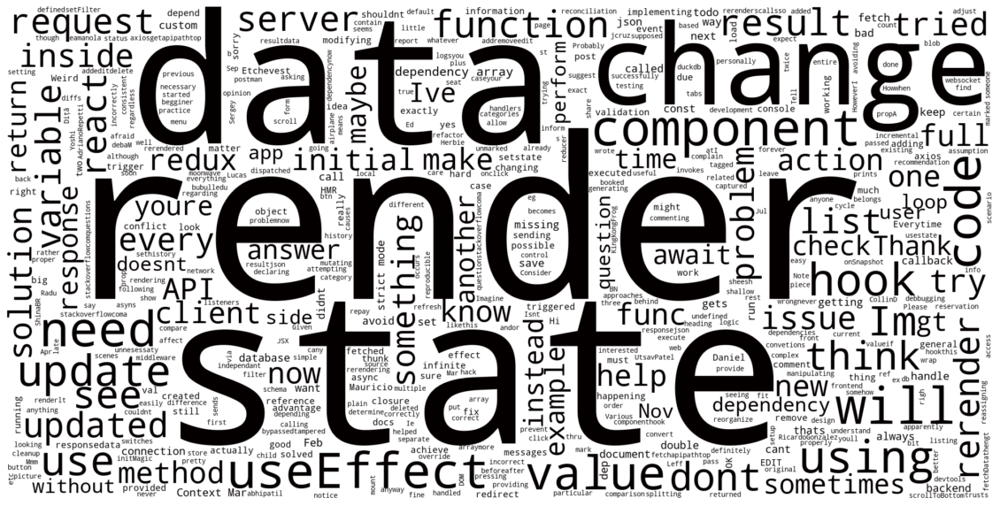

In [50]:
from wordcloud import WordCloud, STOPWORDS

warnings.filterwarnings('ignore')

def black_color_func(word, font_size, position,orientation,random_state=None, **kwargs):
    return("hsl(0,100%, 1%)")

cloud = WordCloud( background_color="white", width=2000, height=1000, max_words=500).generate(all_sentences)
cloud.recolor(color_func=black_color_func)
plt.figure(figsize=(20, 40))
plt.imshow(cloud, interpolation="bilinear")
plt.axis("off")
plt.show()

warnings.resetwarnings()

## 5. Sentiment Analysis

#### 5.1 Preparing the sentences

In [51]:
allCommentsGroupedCleanedSentDict = copy.deepcopy(allCommentsGroupedCleanedDict)

allCommentsGroupedCleanedSentDict = {k: v for k, v in allCommentsGroupedCleanedSentDict.items() if v['comments'] or v['answers'] or v['answer_comments']}
for key, value in allCommentsGroupedCleanedSentDict.items():
  del value['answers_cmts_joined']
  del value['answers_joined']
  del value['comments_joined']
  
  # make new key 
  value['all_sentences'] = []
  all_comments_arr = []
  all_answers_arr = []
  all_answer_cmts_arr = []
   
  for comment in value['comments']:
    if comment['comment']: 
      all_comments_arr.append(comment['comment'])
    
  for answer in value['answers']:
    if answer['answer']:
      all_answers_arr.append(answer['answer'])
    
  for answer_cmt in value['answer_comments']:
    if answer_cmt['answer_cmt']:
      all_answer_cmts_arr.append(answer_cmt['answer_cmt'])

  value['all_sentences'] =  all_comments_arr + all_answers_arr + all_answer_cmts_arr
  
  # sentence tokenization
  value['all_sentences'] = [sent_tokenize(sentence) for sentence in value['all_sentences']]
  # flatten 
  value['all_sentences'] = [item for sublist in value['all_sentences'] for item in sublist]

print(yaml.dump(allCommentsGroupedCleanedSentDict, allow_unicode=True, default_flow_style=False))

Cancel a dynamic import in React useEffect hook:
  all_sentences:
  - checkout this question, it's kinda similar
  answer_comments: []
  answers: []
  comments:
  - comment: checkout this question, it's kinda similar
    datetime: '2022-07-21 12:38:43Z'
    id: comment-129047134
    url:
    - !!python/tuple
      - https://stackoverflow.com/questions/72096891/useeffect-cleanup-in-react-18
      - this
    votes: 0.0
Confusing React useEffect hook behaviour:
  all_sentences:
  - '1.'
  - State update is asynchronous.
  - '2.'
  - State is constant within a particular render of a component.
  - '3.'
  - Component can't see the updated state until it re-renders.
  - '4.'
  - Callback function of the hook has a closure over the state.
  - Thanks for your comment, but it's too much theory for a beginner like me.
  - I don't understand.
  - React batches all the useState updates and commits them at once since it is async.
  - But prints the value at the time when it is encountered and does 

##### 5.2 Scoring post with sentiment

In [52]:
tokenizer = AutoTokenizer.from_pretrained("cardiffnlp/twitter-roberta-base-sentiment-latest")
config = AutoConfig.from_pretrained("cardiffnlp/twitter-roberta-base-sentiment-latest")
model = AutoModelForSequenceClassification.from_pretrained("cardiffnlp/twitter-roberta-base-sentiment-latest")

allCommentsGroupedCleanedSentDict = copy.deepcopy(allCommentsGroupedCleanedSentDict)

for key, value in allCommentsGroupedCleanedSentDict.items():
  list_of_sentences = value['all_sentences']
  print('working on', key, 'with', len(list_of_sentences), 'sentences')
  print(yaml.dump(list_of_sentences, allow_unicode=True, default_flow_style=False))
  output = model(**tokenizer(list_of_sentences, padding=True, truncation=True, return_tensors="pt"))

  list_of_sentences_with_sentiment = []

  for j in range(len(list_of_sentences)):
    scores = output[0][j].detach().numpy()
    scores = softmax(scores)
    ranking = np.argsort(scores)
    ranking = ranking[::-1]
    for i in range(scores.shape[0]):
        l = config.id2label[ranking[i]]
        s = scores[ranking[i]]

        if(list_of_sentences[j] not in [ sentence['sentence'] for sentence in list_of_sentences_with_sentiment]):
          list_of_sentences_with_sentiment.append(
            {
              'sentence': list_of_sentences[j],
              l:  np.round(float(s), 4),
            }
          )
        else:
          index =  [ sentence['sentence'] for sentence in list_of_sentences_with_sentiment].index(list_of_sentences[j])
          list_of_sentences_with_sentiment[index][l] = np.round(float(s), 4)
        

  averagePositiveSentimentScore = sum([ sentence['positive'] for sentence in list_of_sentences_with_sentiment]) / len(list_of_sentences_with_sentiment)
  averageNegativeSentimentScore = sum([ sentence['negative'] for sentence in list_of_sentences_with_sentiment]) / len(list_of_sentences_with_sentiment)
  averageNeutralSentimentScore = sum([ sentence['neutral'] for sentence in list_of_sentences_with_sentiment]) / len(list_of_sentences_with_sentiment)
  
  value['all_sentences_with_sentiment'] = list_of_sentences_with_sentiment
  value['avg_positive_sentiment'] = averagePositiveSentimentScore
  value['avg_negative_sentiment'] = averageNegativeSentimentScore
  value['avg_neutral_sentiment'] = averageNeutralSentimentScore

print(yaml.dump(allCommentsGroupedCleanedSentDict, allow_unicode=True, default_flow_style=False))

Some weights of the model checkpoint at cardiffnlp/twitter-roberta-base-sentiment-latest were not used when initializing RobertaForSequenceClassification: ['roberta.pooler.dense.weight', 'roberta.pooler.dense.bias']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Asking to truncate to max_length but no maximum length is provided and the model has no predefined maximum length. Default to no truncation.


working on React - useEffect with 146 sentences
- I am very sorry for the late response.
- Thank you very much for your comment.
- Not calling the child component as a function solved the issue.
- That was general recommendation though, a bit weird it helped with ; if you can
  share reproducible example, I could try to look what was the issue
- Isn't that what the code already does?
- I would expect to only execute when is not .
- You are mutating your state instead of reassigning it with the callback you created
  via .
- Consider splitting your state into independant values instead of one big blob.
- Are you using React strict mode?
- Strict mode double invokes certain methods on your development server.
- You shouldn't be manipulating the DOM like that in React.
- You should be setting new state with that information, and allow the JSX in your
  render using that updated state.
- why you need messages dependency?
- We need to see the full code of the component in order to help ^^
-

: 

: 

## 6. Rank Post

In [ ]:
warnings.filterwarnings('ignore')

allCommentsSentiment = copy.deepcopy(allCommentsGroupedCleanedSentDict)

# sort by avg positive sentiment
allCommentsSentiment = {k: v for k, v in allCommentsSentiment.items() if v['avg_positive_sentiment'] or v['avg_negative_sentiment'] or v['avg_neutral_sentiment']}
allCommentsSentiment = {k: v for k, v in sorted(allCommentsSentiment.items(), key=lambda item: item[1]['avg_positive_sentiment'], reverse=True)}

ACS_df = pd.DataFrame()
for key, value in list(allCommentsSentiment.items()):
  row_data = {
    'title': key,
    'avg_positive_sentiment': value['avg_positive_sentiment'],
    'avg_negative_sentiment': value['avg_negative_sentiment'],
    'avg_neutral_sentiment': value['avg_neutral_sentiment'],
    'sentence_list': value['all_sentences']
  }

  ACS_df = pd.concat([ACS_df, pd.DataFrame([row_data])], ignore_index=True)

warnings.resetwarnings()

ACS_df = ACS_df.sort_values(by=['avg_positive_sentiment'], ascending=False)
display(ACS_df.head(10))

,title,avg_positive_sentiment,avg_negative_sentiment,avg_neutral_sentiment,sentence_list
0,React useEffect gives react-hooks/exhaustive-d...,0.353550,0.387000,0.259450,[this might help u.. stackoverflow.com/questio...
1,React useEffect dependencies for subscribe/uns...,0.089288,0.090641,0.820071,"[reading the source code, you can see that the..."
2,React useEffect hook with warning react-hooks/...,0.074200,0.066700,0.859100,[code for should be returned from callback]


#### 6.1 Rank Post Result Analysis

In [ ]:
import warnings
warnings.filterwarnings('ignore')

second_summary_filtered = ACS_df.head(10)

second_summary_filtered_df = pd.DataFrame(columns=['title', 'avg_positive_sentiment', 'avg_negative_sentiment', 'avg_neutral_sentiment' 'sentences_grouped'])
for index, row in second_summary_filtered.iterrows():
  sentences_grouped = []
  for sentence in row['sentence_list']:
    sentences_grouped.append(sentence)
      
    row_data = {
        'title': row['title'],
        'avg_positive_sentiment': row['avg_positive_sentiment'],
        'avg_negative_sentiment': row['avg_negative_sentiment'],
        'avg_neutral_sentiment': row['avg_neutral_sentiment'],
        'sentences_grouped': "".join(sentences_grouped)
    }

    second_summary_filtered_df = pd.concat([second_summary_filtered_df, pd.DataFrame([row_data])], ignore_index=True)

all_sentences = ""

for index, row in second_summary_filtered_df.iterrows():
  all_sentences += row['sentences_grouped']

warnings.resetwarnings()

print(len(all_sentences))

12034


#### 6.2 Plot Word Cloud

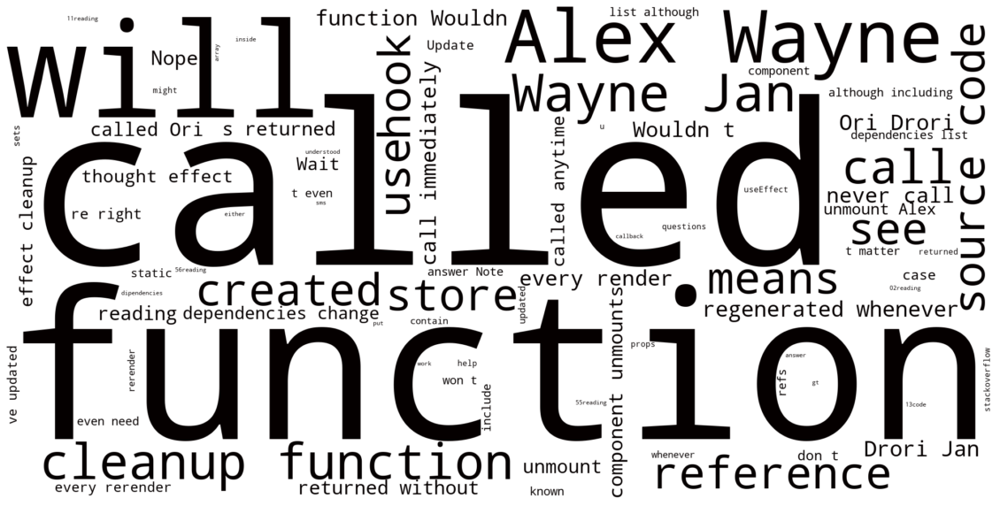

In [ ]:
from wordcloud import WordCloud, STOPWORDS

warnings.filterwarnings('ignore')

def black_color_func(word, font_size, position,orientation,random_state=None, **kwargs):
    return("hsl(0,100%, 1%)")

cloud = WordCloud( background_color="white", width=2000, height=1000, max_words=500).generate(all_sentences)
cloud.recolor(color_func=black_color_func)
plt.figure(figsize=(20, 40))
plt.imshow(cloud, interpolation="bilinear")
plt.axis("off")
plt.show()

warnings.resetwarnings()

## 7. Summarize Top 5 

In [ ]:
allCommentsSentimentSum = copy.deepcopy(allCommentsSentiment)
#only take top 5
allCommentsSentimentSum = {k: v for k, v in list(allCommentsSentimentSum.items())[:5]}

top_5_ACS_df = ACS_df.head(5)
display(top_5_ACS_df)

top_5_ACS_dict = top_5_ACS_df.to_dict('index')

print(top_5_ACS_dict)

,title,avg_positive_sentiment,avg_negative_sentiment,avg_neutral_sentiment,sentence_list
0,React useEffect gives react-hooks/exhaustive-d...,0.353550,0.387000,0.259450,[this might help u.. stackoverflow.com/questio...
1,React useEffect dependencies for subscribe/uns...,0.089288,0.090641,0.820071,"[reading the source code, you can see that the..."
2,React useEffect hook with warning react-hooks/...,0.074200,0.066700,0.859100,[code for should be returned from callback]


{0: {'title': 'React useEffect gives react-hooks/exhaustive-deps error on publishing', 'avg_positive_sentiment': 0.35355, 'avg_negative_sentiment': 0.387, 'avg_neutral_sentiment': 0.25944999999999996, 'sentence_list': ['this might help u.. stackoverflow.com/questions/58866796/…', "@sms from what I understood I have to put the props inside the useEffect array of dipendencies but that doesn't work either: useEffect(() =&gt; {...},[props])"]}, 1: {'title': 'React useEffect dependencies for subscribe/unsubscribe with eslint exhaustive-deps', 'avg_positive_sentiment': 0.08928823529411764, 'avg_negative_sentiment': 0.09064117647058823, 'avg_neutral_sentiment': 0.820070588235294, 'sentence_list': ['reading the source code, you can see that the functions are not created with , this means that they are regenerated whenever the hook is called.you can store a reference to the functions in a , and use the to call the function:', " Wouldn\\'t that call immediately after every render, but never call

#### 7.1 Using BartLargeCNN by Hugging Face

In [ ]:
from transformers import AutoTokenizer, AutoModelForSeq2SeqLM

tokenizer = AutoTokenizer.from_pretrained("facebook/bart-large-cnn")
model = AutoModelForSeq2SeqLM.from_pretrained("facebook/bart-large-cnn")

top_5_ACS_dict_BART = copy.deepcopy(top_5_ACS_dict)

for key, value in top_5_ACS_dict_BART.items():
    print("Summarizing ", key)
    joined_sentence = ' '.join(value['sentence_list'])
    if len(joined_sentence) > 1024:
      joined_sentence = joined_sentence[:1020] 
    input_ids = tokenizer.encode(joined_sentence, return_tensors='pt')
    summary_ids = model.generate(input_ids)
    top_5_ACS_dict_BART[key]['summary'] = tokenizer.decode(summary_ids[0], skip_special_tokens=True)
    
print(yaml.dump(top_5_ACS_dict_BART, allow_unicode=True, default_flow_style=False))

Summarizing  0


/Users/shaun/miniforge3/lib/python3.9/site-packages/transformers/generation/utils.py:1387: UserWarning: Neither `max_length` nor `max_new_tokens` has been set, `max_length` will default to 142 (`self.config.max_length`). Controlling `max_length` via the config is deprecated and `max_length` will be removed from the config in v5 of Transformers -- we recommend using `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Summarizing  1
Summarizing  2
0:
  avg_negative_sentiment: 0.387
  avg_neutral_sentiment: 0.25944999999999996
  avg_positive_sentiment: 0.35355
  sentence_list:
  - this might help u.. stackoverflow.com/questions/58866796/…
  - '@sms from what I understood I have to put the props inside the useEffect array
    of dipendencies but that doesn''t work either: useEffect(() =&gt; {...},[props])'
  summary: 'this might help u.. stackoverflow.com/questions/58866796/… @sms from what
    I understood I have to put the props inside the useEffect array of dipendencies
    but that doesn''t work either: useEffect(() =&gt; {...},[props])'
  title: React useEffect gives react-hooks/exhaustive-deps error on publishing
1:
  avg_negative_sentiment: 0.09064117647058823
  avg_neutral_sentiment: 0.820070588235294
  avg_positive_sentiment: 0.08928823529411764
  sentence_list:
  - 'reading the source code, you can see that the functions are not created with
    , this means that they are regenerated wheneve

##### 7.1.1 Bart Large CNN Result Analysis

In [ ]:
import warnings
warnings.filterwarnings('ignore')

third_summary_filtered = pd.DataFrame(top_5_ACS_dict_BART).T
display(third_summary_filtered)

all_sentences = ""
for index, row in third_summary_filtered.iterrows():
  all_sentences += row['summary']

warnings.resetwarnings()

print(len(all_sentences))

,title,avg_positive_sentiment,avg_negative_sentiment,avg_neutral_sentiment,sentence_list,summary
0,React useEffect gives react-hooks/exhaustive-d...,0.35355,0.387,0.25945,[this might help u.. stackoverflow.com/questio...,this might help u.. stackoverflow.com/question...
1,React useEffect dependencies for subscribe/uns...,0.089288,0.090641,0.820071,"[reading the source code, you can see that the...","Reading the source code, you can see that the ..."
2,React useEffect hook with warning react-hooks/...,0.0742,0.0667,0.8591,[code for should be returned from callback],code for should be returned from callback. Cod...


770


#### 7.1.2 Plot Word Cloud

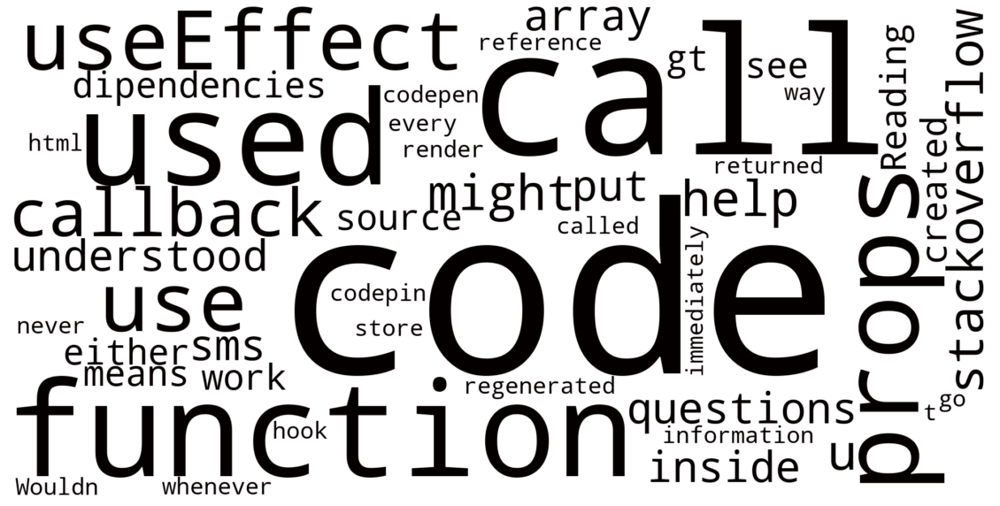

In [ ]:
from wordcloud import WordCloud, STOPWORDS

warnings.filterwarnings('ignore')

def black_color_func(word, font_size, position,orientation,random_state=None, **kwargs):
    return("hsl(0,100%, 1%)")

cloud = WordCloud( background_color="white", width=2000, height=1000, max_words=500).generate(all_sentences)
cloud.recolor(color_func=black_color_func)
plt.figure(figsize=(20, 40))
plt.imshow(cloud, interpolation="bilinear")
plt.axis("off")
plt.show()

warnings.resetwarnings()

### 7.2 Pegasus-XSUM

In [ ]:
from transformers import AutoTokenizer, AutoModelForSeq2SeqLM

tokenizer = AutoTokenizer.from_pretrained("google/pegasus-xsum")
model = AutoModelForSeq2SeqLM.from_pretrained("google/pegasus-xsum")

top_5_ACS_dict_PXSUM = copy.deepcopy(top_5_ACS_dict)

for key, value in top_5_ACS_dict_PXSUM.items():
    print("Summarizing ", key)
    joined_sentence = ' '.join(value['sentence_list'])
    if len(joined_sentence) > 1024:
      joined_sentence = joined_sentence[:1020] 
    input_ids = tokenizer.encode(joined_sentence, return_tensors='pt')
    summary_ids = model.generate(input_ids)
    top_5_ACS_dict_PXSUM[key]['summary'] = tokenizer.decode(summary_ids[0], skip_special_tokens=True)
    
print(yaml.dump(top_5_ACS_dict_PXSUM, allow_unicode=True, default_flow_style=False))

Summarizing  0


/Users/shaun/miniforge3/lib/python3.9/site-packages/transformers/generation/utils.py:1387: UserWarning: Neither `max_length` nor `max_new_tokens` has been set, `max_length` will default to 64 (`self.config.max_length`). Controlling `max_length` via the config is deprecated and `max_length` will be removed from the config in v5 of Transformers -- we recommend using `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Summarizing  1
Summarizing  2
0:
  avg_negative_sentiment: 0.387
  avg_neutral_sentiment: 0.25944999999999996
  avg_positive_sentiment: 0.35355
  sentence_list:
  - this might help u.. stackoverflow.com/questions/58866796/…
  - '@sms from what I understood I have to put the props inside the useEffect array
    of dipendencies but that doesn''t work either: useEffect(() =&gt; {...},[props])'
  summary: '@sms from what I understood I have to put the props inside the use of
    dipendencies but that work either: use doesn''t work either:'
  title: React useEffect gives react-hooks/exhaustive-deps error on publishing
1:
  avg_negative_sentiment: 0.09064117647058823
  avg_neutral_sentiment: 0.820070588235294
  avg_positive_sentiment: 0.08928823529411764
  sentence_list:
  - 'reading the source code, you can see that the functions are not created with
    , this means that they are regenerated whenever the hook is called.you can store
    a reference to the functions in a , and use the to ca

#### 7.2.1 Pegasus XSUM Result Analysis

In [ ]:
import warnings
warnings.filterwarnings('ignore')

third_summary_filtered = pd.DataFrame(top_5_ACS_dict_PXSUM).T
display(third_summary_filtered)

all_sentences = ""
for index, row in third_summary_filtered.iterrows():
  all_sentences += row['summary']

warnings.resetwarnings()

print(len(all_sentences))

,title,avg_positive_sentiment,avg_negative_sentiment,avg_neutral_sentiment,sentence_list,summary
0,React useEffect gives react-hooks/exhaustive-d...,0.35355,0.387,0.25945,[this might help u.. stackoverflow.com/questio...,@sms from what I understood I have to put the ...
1,React useEffect dependencies for subscribe/uns...,0.089288,0.090641,0.820071,"[reading the source code, you can see that the...",Is there a way to regenerate functions wheneve...
2,React useEffect hook with warning react-hooks/...,0.0742,0.0667,0.8591,[code for should be returned from callback],


196


#### 7.2.2 Plot Word Cloud

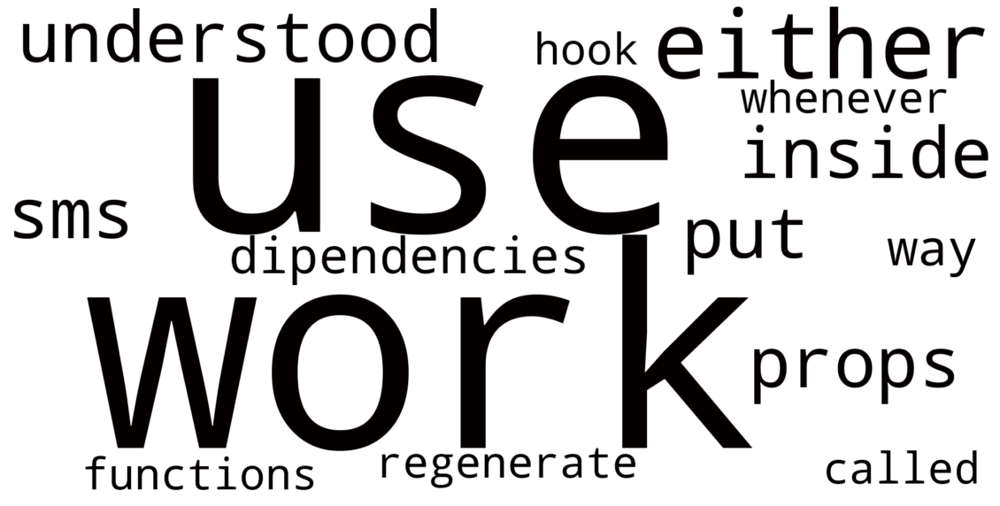

In [ ]:
from wordcloud import WordCloud, STOPWORDS

warnings.filterwarnings('ignore')

def black_color_func(word, font_size, position,orientation,random_state=None, **kwargs):
    return("hsl(0,100%, 1%)")

cloud = WordCloud( background_color="white", width=2000, height=1000, max_words=500).generate(all_sentences)
cloud.recolor(color_func=black_color_func)
plt.figure(figsize=(20, 40))
plt.imshow(cloud, interpolation="bilinear")
plt.axis("off")
plt.show()

warnings.resetwarnings()

### 7.3 Comparing Both Deep Learning Models

##### We'll be comparing their summarized text based on a single question asked

In [ ]:
pd.DataFrame(top_5_ACS_dict_PXSUM).T.to_csv('top_5_ACS_dict_PXSUM.csv')
pd.DataFrame(top_5_ACS_dict_BART).T.to_csv('top_5_ACS_dict_BART.csv')

In [ ]:
pd.set_option('display.expand_frame_repr', False)

summary_compare_df =  pd.DataFrame(columns=['title', 'summary'])

# load from two files
top_5_ACS_dict_PXSUM = pd.read_csv('top_5_ACS_dict_PXSUM.csv')
top_5_ACS_dict_BART = pd.read_csv('top_5_ACS_dict_BART.csv')

pd.set_option('display.max_colwidth', None)

for index, row in top_5_ACS_dict_PXSUM.iterrows():
  row_data = {
    'title': row['title'],
    'summary': row['summary']
  }

  summary_compare_df = pd.concat([summary_compare_df, pd.DataFrame([row_data])], ignore_index=True)
  
display(summary_compare_df)

for index, row in top_5_ACS_dict_BART.iterrows():
  row_data = {
    'title': row['title'],
    'summary': row['summary']
  }

  summary_compare_df = pd.concat([summary_compare_df, pd.DataFrame([row_data])], ignore_index=True)
  
display(summary_compare_df)

end_time = time.time()
print(end_time - start_time) # time in seconds

,title,summary
0,React useEffect gives react-hooks/exhaustive-deps error on publishing,@sms from what I understood I have to put the props inside the use of dipendencies but that work either: use doesn't work either:
1,React useEffect dependencies for subscribe/unsubscribe with eslint exhaustive-deps,Is there a way to regenerate functions whenever the hook is called?
2,React useEffect hook with warning react-hooks/exhaustive-deps,NaN


,title,summary
0,React useEffect gives react-hooks/exhaustive-deps error on publishing,@sms from what I understood I have to put the props inside the use of dipendencies but that work either: use doesn't work either:
1,React useEffect dependencies for subscribe/unsubscribe with eslint exhaustive-deps,Is there a way to regenerate functions whenever the hook is called?
2,React useEffect hook with warning react-hooks/exhaustive-deps,NaN
3,React useEffect gives react-hooks/exhaustive-deps error on publishing,"this might help u.. stackoverflow.com/questions/58866796/… @sms from what I understood I have to put the props inside the useEffect array of dipendencies but that doesn't work either: useEffect(() =&gt; {...},[props])"
4,React useEffect dependencies for subscribe/unsubscribe with eslint exhaustive-deps,"Reading the source code, you can see that the functions are not created with, this means that they are regenerated whenever the hook is called. You can store a reference to the functions in a, and use the to call the function: Wouldn\'t that call immediately after every render, but never call more than once?"
5,React useEffect hook with warning react-hooks/exhaustive-deps,"code for should be returned from callback. Code for should not be used in any other way. Code should only be used when it is used in a callback. For more information on how to use this code, go to: http://www.codepen.com/codepin/code-for.html."


435.5277271270752
